# Исследование рынка заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» хотят открыть заведение общественного питания в Москве. Местоположение, тип заведения меню и цены будет зависеть от проведённого исследования. 

Для начала необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Предоставлен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

<font size=+1><b>Описание данных:</b></font><br>
В основных данных есть информация о заведениях общественного питания Москвы moscow_places.csv

* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* `price` — категория цен в заведении;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона;
* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым;
    * 0 — заведение не является сетевым
    * 1 — заведение является сетевым
* `district` — административный район, в котором находится заведение, например Центральный административный округ;
* `seats` — количество посадочных мест.

<font size=+1><b>План работы:</b></font><br>
- Загрузить данные и изучить общую информацию.
- Выполнить предобработку данных.
- Посмотреть распределении заведений по категориям и проанализировать результаты.
- Исследовать количество посадочных мест в местах по категориям.
- Рассмотреть соотношение сетевых и несетевых заведений.
- Определить, какие категории заведений чаще являются сетевыми.
- Найти топ-15 популярных (по количеству заведений этой сети в регионе) сетей в Москве. Определить признак, который их объединяет.
- Посмотреть распределение количества заведений каждой категории по административным районам.
- Посмотреть распределение средних рейтингов по категориям заведений.
- Проанализировать фоновую картограмму со средним рейтингом заведений каждого района.
- Найти топ-15 улиц по количеству заведений.
- Проанализировать улицы, на которых находится только один объект общепита. 
- Проанализировать фоновую картограмму со средними чеками для каждого административного района. Определить, как удалённость от центра влияет на цены в заведениях.
- Сделать общий вывод по исследованию заведений общепита Москвы.
- Определить популярность кофеен в Москве, особенности их расположения.
- Определить количество круглосуточных кофеен.
- Выяснить, на какую стоимость чашки капучино стоит ориентироваться при открытии кофейни.
- Попробовать дать рекомендацию для открытия нового заведения.
- Подготовить презентацию исследования для инвесторов. 

## Загрузка данных

### Используемые библиотеки и функции

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from numpy import median
from plotly import graph_objects as go
import plotly.express as px
# импортируем карту, хороплет и маркер
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

In [2]:
import matplotlib
%config InlineBackend.figure_format = 'retina'
matplotlib.style.use('fivethirtyeight')
plt.rc('figure', figsize=(20, 8))

In [3]:
# функция для загрузки данных
def main_info (dataset):
    data = pd.read_csv(dataset)
    pd.set_option('max_colwidth', 200)
    display(data.head())
    print('------------------------------------------')
    display('Основная информация по столбцам таблицы:')
    display(data.info())
    print('-------------------------------------')
    display('Доля пропусков по столбцам таблицы:')
    display(pd.DataFrame(round(data.isna().mean()
                         .sort_values(ascending=False), 3))
                         .style.background_gradient('coolwarm')
                         .format('{:.1%}'))
    print('---------------------------------')
    display('Основная информация по таблице:')
    display(data.describe().style.format('{:.1f}'))
    print('----------------------------------------')
    display('Количество явных дубликатов в таблице:')
    display(data.duplicated().sum())
    print('--------------')
    display('Гистограммы:')
    data.hist()
    plt.show();
    return data

In [4]:
# функция для построения гистограммы + боксплот
def first_hist(data, column, h_bins):
    plt.subplot(1,2,1)
    x_lim_min = data[~data[column].isna()][column].min()
    x_lim_max = np.percentile(data[~data[column].isna()][column], 99)
    data[column].plot(kind='hist',
                      bins=h_bins,
                      xlim=[x_lim_min, x_lim_max])
    plt.ylabel('Количество заведений')
    plt.xlabel(column)
    plt.subplot(1,2,2)
    data[column].plot(kind='box')
    plt.show();

In [5]:
# функция для определения режима заведения 24/7
def categorize_time(time):
    try:
        if ('ежедневно' in time) & ('круглосуточно' in time):
            return True
        else:
            return False
    except:    
        return False

In [6]:
# функция для построения графиков
def plot_bar(data, values_x, values_y, values_text, format_text, values_color):
    return px.bar(data, 
                  x=values_x, 
                  y=values_y,
                  text=data[values_text].apply(lambda x: format_text.format(x)),
                  color=values_color,
                  color_discrete_map=color_plot)

In [7]:
# функция для построения графиков "ящик"
def plot_box(data, values_x, values_y, values_color, values_orders):
    return px.box(data,
                  x=values_x, 
                  y=values_y,
                  color=values_color,
                  color_discrete_map=color_plot,
                  category_orders={values_color: data.groupby(by=[values_color])[values_orders] \
                                                     .median() \
                                                     .sort_values(ascending=False)\
                                                     .index.to_list()})

In [8]:
# функция для построения сложных графиков
def plot_hard_bar(data, values_x, values_y, values_text, values_color):
    grouped = data.loc[:,[values_y, values_x]] \
                  .groupby(by=[values_y]) \
                  .sum() \
                  .sort_values(by=values_x, ascending=False)

    return px.bar(data, 
                  x=values_x,
                  y=values_y,
                  text=values_text,
                  color=values_color,
                  color_discrete_map=color_plot,
                  category_orders={values_y: grouped.index.to_list()})

In [9]:
# функция для построения хороплёта
def plot_choropleth(df, col_group, values_x, func, leg_name):
    # загружаем JSON-файл с границами округов Москвы
    state_geo = '/datasets/admin_level_geomap.geojson'
    # moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
    moscow_lat, moscow_lng = 55.751244, 37.618423
    # создаём карту Москвы
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(geo_data=state_geo,
               data=df.groupby(col_group, as_index=False)[values_x]\
                      .agg(func),
               columns=[col_group, values_x],
               key_on='feature.name',
               fill_color='YlGn',
               fill_opacity=0.8,
               legend_name=leg_name,
              ).add_to(m)

    # создаём пустой кластер, добавляем его на карту
    marker_cluster = MarkerCluster().add_to(m)

    # пишем функцию, которая принимает строку датафрейма,
    # создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
    def create_clusters(row):
        Marker([row['lat'], row['lng']],
               popup=f"{row['name']} {row[values_x]}",
              ).add_to(marker_cluster)

    # применяем функцию create_clusters() к каждой строке датафрейма
    df.apply(create_clusters, axis=1)

    # выводим карту
    return m

### Загрузка данных и основная информация

Посмотрим на основную информацию о заведениях общественного питания Москвы:

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


------------------------------------------


'Основная информация по столбцам таблицы:'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

-------------------------------------


'Доля пропусков по столбцам таблицы:'

,0
middle_coffee_cup,93.6%
middle_avg_bill,62.5%
price,60.6%
avg_bill,54.6%
seats,43.0%
hours,6.4%
name,0.0%
category,0.0%
address,0.0%
district,0.0%


---------------------------------


'Основная информация по таблице:'

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.0,8406.0,8406.0,3149.0,535.0,8406.0,4795.0
mean,55.8,37.6,4.2,958.1,174.7,0.4,108.4
std,0.1,0.1,0.5,1009.7,89.0,0.5,122.8
min,55.6,37.4,1.0,0.0,60.0,0.0,0.0
25%,55.7,37.5,4.1,375.0,124.5,0.0,40.0
50%,55.8,37.6,4.3,750.0,169.0,0.0,75.0
75%,55.8,37.7,4.4,1250.0,225.0,1.0,140.0
max,55.9,37.9,5.0,35000.0,1568.0,1.0,1288.0


----------------------------------------


'Количество явных дубликатов в таблице:'

0

--------------


'Гистограммы:'

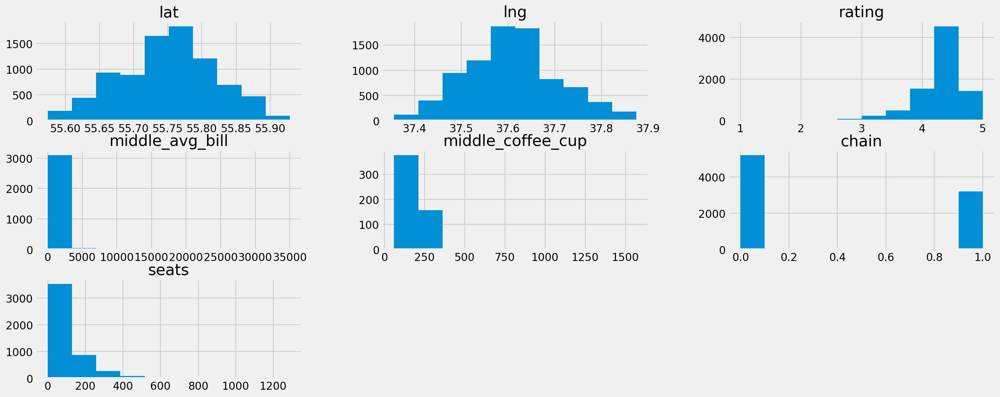

In [10]:
places = main_info('/datasets/moscow_places.csv')

**Промежуточные выводы:**
* В таблице содержится 13 столбцов и 8406 записей с информацией о заведениях общепита Москвы.
* В таблице нет явных дубликатов, но зато есть пропущенные значения в столбцах со чеком заведения и средней ценой за чашку кофе, информацией о количестве посадочных мест и времени работы. 
* Доля пропусков в пяти столбцах занимает более 40% от общего количества строк в датафрейме.
* Столбец со временем работы заведения имеет тип данных - объект, так как в нём содержится информация о часах и днях работы заведения.
* В столбцах со средними значениями чека, цены за чашку кофе и количеством посадочных мест присутствуют выбросы.
* Рейтинг выбранных заведений, по большей части, сосредоточен от 4 до 5 баллов.
* В основном, средний чек находится до 5000 р, средняя стоимость чашки кофе - до 500 р. Всё, что выше этих значений, возможно, является аномалиями. 
* В Москве в выбранной зоне только около 3000 заведений сетевые, около 5000 заведений являются не сетевыми. 
* Количество посадочных мест - до 500, при этом, больше заведений с количеством мест до 100, всё, что больше - возможно, аномалии.

## Подготовка данных

### Обработка дубликатов

Явных дубликатов в таблице не было. Посмотрим на возможные неявные дубликаты:

In [11]:
# Переменная для контроля % удалённых значений
del_value = [0, places.shape[0]]

In [12]:
places['district'].sort_values().unique()

array(['Восточный административный округ',
       'Западный административный округ',
       'Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Юго-Восточный административный округ',
       'Юго-Западный административный округ',
       'Южный административный округ'], dtype=object)

Как видно, районов всего 9 и все они являются уникальными.

In [13]:
places['category'].sort_values().unique()

array(['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня',
       'пиццерия', 'ресторан', 'столовая'], dtype=object)

Категорий заведений представлено 8 штук, и они тоже уникальные.

Приведём категориальные переменные к нижнему регистру в столбцах с названием заведения и адресом, чтобы выявить неявные дубликаты в этих столбцах.

In [14]:
places['name'] = places['name'].str.lower()
places['address'] = places['address'].str.lower()

Посмотрим, сколько всего заведений представлено:

In [15]:
print('Размерность датафрейма: ', places.shape[0])
print('Количество заведений: ', places['name'].nunique())

Размерность датафрейма:  8406
Количество заведений:  5512


Уникальных названий заведений 5512 штук из 8406 строчек данных. Это подтверждает тот факт, что около 3000 заведений являются сетевыми (у сетевых заведений одно и тоже название). Также у некоторых заведений может быть просто одинаковое расспространённое название, но при этом они не являются сетевыми.

Проверим наличие неполных дубликатов в данных по ключевым столбцам.

In [16]:
print('Количество неполных дубликатов: ', 
      places[places[['name', 'address']].duplicated()]['name'].count())

Количество неполных дубликатов:  4


Как видно, таких кафе в данных 4 штуки. У остальных сетевых заведений одно и тоже название, но адреса у таких заведений разные. Удалим строчки с неполными дубликатами из данных.

In [17]:
places = places[~places[['name', 'address']].duplicated()].reset_index(drop=True)
del_value[0] = places.shape[0]

### Обработка пропусков

Посмотрим ещё раз в каких столбцах и сколько было пропусков данных.

In [18]:
display(pd.DataFrame(round(places.isna().mean()
                         .sort_values(ascending=False), 3))
                         .style.background_gradient('coolwarm')
                         .format('{:.1%}'))

,0
middle_coffee_cup,93.6%
middle_avg_bill,62.5%
price,60.5%
avg_bill,54.6%
seats,43.0%
hours,6.4%
name,0.0%
category,0.0%
address,0.0%
district,0.0%


Больше всего пропусков для стоимости чашки кофе, среднего счёта заведения и категорий цен в заведении - более 60% пропусков. Также более 50% в стобце с диапазоном чека заведения и более 40% с количеством посадочных мест. Есть до 10% пропусков в столбце с часами работы заведения.

Так как данные брались автоматически с яндекс карты, то пропущенные значения в столбцах - это нормальное явление, эта информация была не предоставлена самим заведением.

В столбце `price`, `hours` и `avg_bill` пропуски заполнить не получится, так как в этих столбцах находятся не только численные данные, но и словесные описания характера работы заведения или стоимости среднего чека.

В столбце `middle_coffee_cup` со средней ценой за чашку капучино не получится заполнить пропуски, так как в этом столбце находится не строгий критерий оценки, а качественная характеристика заведения, которая является не обязательной (в заведении, к примеру, может не быть капучино в меню).

Заполнять пропуски средними или медианными значениями по названию заведения в данном случае некорректно, так как количество мест в сетевых заведениях, в разных районах, может отличаться. Также в мелких сетях, так как данные собирались автоматически с яндекс карты, то могут быть ошибки. Оставим пропуски как есть.

### Обработка аномалий

Можно подробнее остановиться на изучении аномалий в данных. Посмотрим на гистограммы параметров подробнее, чтобы принять решение на счёт удаления. 

Первым параметром для рассмотрения будет количество посадочных мест.

In [19]:
places['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

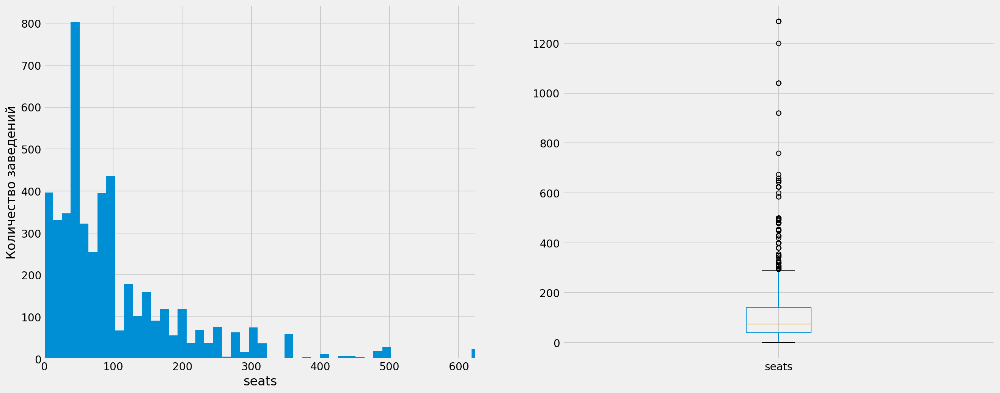

In [20]:
first_hist(places, 'seats', 100)

In [21]:
print('95 и 99 перцентиль для количества посадочных мест: ',
      "{0:.1f}".format(np.percentile(places[~places['seats'].isna()]['seats'], 95)), ', '
      "{0:.1f}".format(np.percentile(places[~places['seats'].isna()]['seats'], 99)))

95 и 99 перцентиль для количества посадочных мест:  307.0 , 625.0


Медианное значение посадочных мест находится в области 75 штук, а всё, что выше 300 посадочных мест считается выбросами. При этом 99 перцентиль равняется 625, а 95 - 307. По гистограмме видно, что крайне мало заведений приходится на зону от 400 посадочных мест и больше.

*По санпину есть ограничение на минимальное количество посадочных мест и требования к каждой категории заведений, по максимальному ограничений нет. При этом в России есть самый крупный ресторан с 1200 посадочными местами, поэтому такие выбросы кажутся реальными, но отражать общую картину по общепиту в Москве они не могут. Так что можно ограничить выборку 99 перцентилем).*

Вторым по очереди рассмотрим средний чек заведения.

In [22]:
places['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

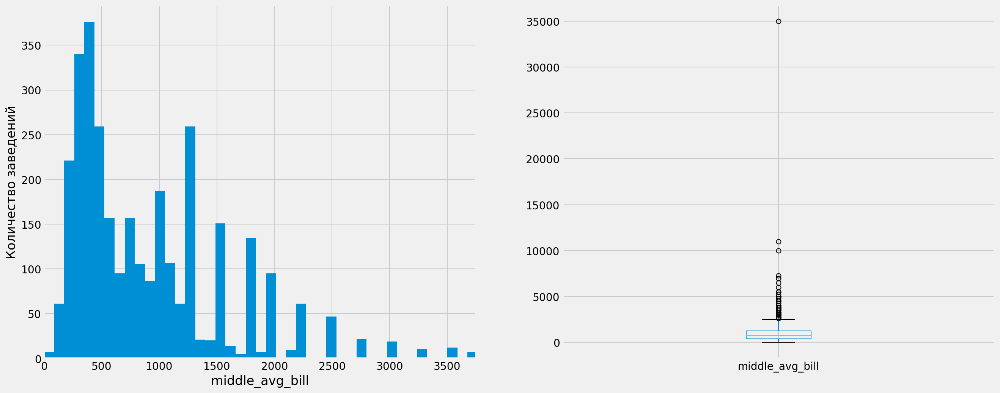

In [23]:
first_hist(places, 'middle_avg_bill', 400)

In [24]:
print('95 и 99 перцентиль для среднего чека заведения: ',
      "{0:.1f}".format(np.percentile(places[~places['middle_avg_bill'].isna()]['middle_avg_bill'], 95)), ', '
      "{0:.1f}".format(np.percentile(places[~places['middle_avg_bill'].isna()]['middle_avg_bill'], 99)))

95 и 99 перцентиль для среднего чека заведения:  2250.0 , 3750.0


Медианное значение среднего чека приходится на значение 750 рублей, а всё. что выше 2500 рублей считается выбросами. 99 перцентиль равен 3750 рублей, а 95 перцентиль равен 2250 рублей. На гистограмме находятся странные значения после 5000 рублей (например, средний чек в заведение, равный 35 тыс, доверия не вызывает). 

Третьим по очереди рассмотрим стоимость средней чашки кофе в заведении.

In [25]:
places['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

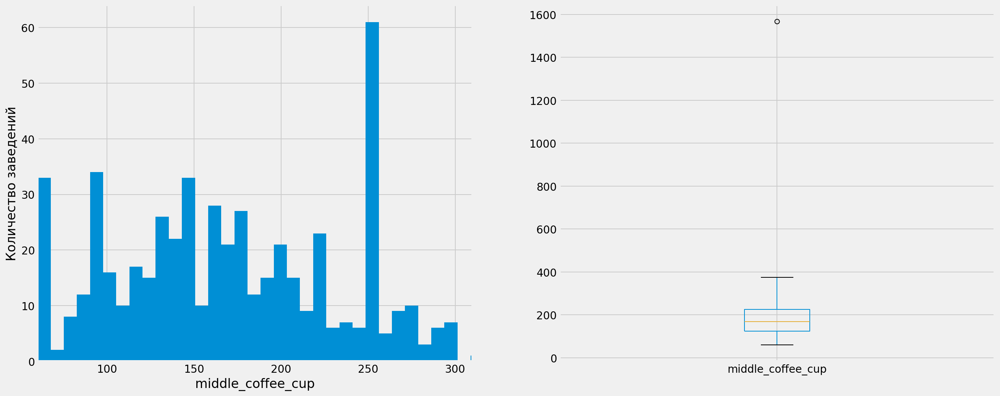

In [26]:
first_hist(places, 'middle_coffee_cup', 200)

In [27]:
print('95 и 99 перцентиль для среднего цены за чашку кофе: ',
      "{0:.1f}".format(np.percentile(places[~places['middle_coffee_cup'].isna()]['middle_coffee_cup'], 95)), ', '
      "{0:.1f}".format(np.percentile(places[~places['middle_coffee_cup'].isna()]['middle_coffee_cup'], 99)))

95 и 99 перцентиль для среднего цены за чашку кофе:  275.0 , 309.9


Медианное значение стоимости чашки кофе находится в области 170 рублей, а всё, что выше 370 рублей считается выбросами. 99 перцентиль равняется 310 рублям, а 95 перцентиль - 275 рублям. На гистограмме виден странную аномалию около 1600 рублей, что не вызвает доверия. 

Удалим аномальные значения для столбцов: количество посадочных мест, средний чек заведения и средняя цена за чашку кофе. В качестве границы для удаления возьмём 99 перцентиль, чтобы отсечь аномалии для дальнейшего корректного анализа данных, но при этом не удалить слишком много данных из датафрейма. 

In [28]:
places = places[((places['seats'] < \
                  np.percentile(places[~places['seats'].isna()]['seats'], 99)) \
                 | (places['seats'].isna()))\
                & ((places['middle_avg_bill'] < \
                    np.percentile(places[~places['middle_avg_bill'].isna()]
                                        ['middle_avg_bill'], 99)) \
                   | (places['middle_avg_bill'].isna())) \
                & ((places['middle_coffee_cup'] < \
                    np.percentile(places[~places['middle_coffee_cup'].isna()]
                                        ['middle_coffee_cup'], 99)) \
                   | (places['middle_coffee_cup'].isna()))
               ].reset_index(drop=True)
del_value[0] = places.shape[0]

In [29]:
print('Процент удалённых значений: ', 
      "{0:.1%}".format((del_value[1] - del_value[0]) / del_value[1]))

Процент удалённых значений:  1.2%


Выделим улицу заведения и график работы (круглосуточное заведение или нет).

In [30]:
places['street'] = places['address'].str.split(',').str[1].str.strip()

In [31]:
print('Количество уникальных улиц: ', places['street'].nunique())

Количество уникальных улиц:  1442


In [32]:
places['is_24/7'] = places['hours'].apply(categorize_time)

Получим общую информацию о данных. Убедимся, что предобработка выполнена успешно.

In [33]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8307 entries, 0 to 8306
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8307 non-null   object 
 1   category           8307 non-null   object 
 2   address            8307 non-null   object 
 3   district           8307 non-null   object 
 4   hours              7779 non-null   object 
 5   lat                8307 non-null   float64
 6   lng                8307 non-null   float64
 7   rating             8307 non-null   float64
 8   price              3256 non-null   object 
 9   avg_bill           3752 non-null   object 
 10  middle_avg_bill    3097 non-null   float64
 11  middle_coffee_cup  523 non-null    float64
 12  chain              8307 non-null   int64  
 13  seats              4711 non-null   float64
 14  street             8307 non-null   object 
 15  is_24/7            8307 non-null   bool   
dtypes: bool(1), float64(6), 

### Промежуточные выводы:

Была загружена таблица с заведениями Москвы. 
- В таблице 13 столбцов и 8406 строчек.
- В таблице нет явных дубликатов.
- В таблице были неявные дубликаты по названию заведения и адресу размещения. Такие данные из датафрейма были удалены.
- В таблице есть пропуски значений в 6 столбцах, причём в пяти столбцах они занимают более 40 % от значений датафрейма.
- Пропуски были в тех столбцах, по которым само заведение не предоставило информацию: средняя чашка кофе, средний чек, количество посадочных мест, часы работы.
- Было решено оставить пропуски в столбцах со средней ценой в чеке и количеством посадочных мест, а не заполнять их медианными значениями по району в зависимости от типа заведения.
- В других столбцах заполнить пропущенные значения не предоставляется возможным, так как в этих столбцах содержится описательная характеристика заведения.
- Были добавлены столбцы с улицей заведения и графиком работы.
- Были удалены аномальные значения из таблицы в столбцах с количеством посадочных мест, со средним чеком. 
- Удалённые данные составили 1.2% от всех данных в датафрейме.
- Данные подготовлены для дальнейшего анализа.

## Анализ данных

### Категории заведений

В данных предоставлены 8 категорий заведений. Посмотрим на количество объектов общественного питания по категориям.

In [34]:
# Количество заведений по категориям
places_category = places.groupby(by=['category'], as_index=False)\
                        .agg(total_places = ('name', 'count'),
                             seats = ('seats', 'median'),
                             chain = ('chain', 'sum'),
                             rating = ('rating', 'mean'))\
                        .sort_values(by=('total_places'), ascending=False)
places_category['seats'] = places_category['seats'].astype('int64')
places_category['part_places'] = places_category['total_places'] / places_category['total_places'].sum()
places_category['part_chain'] = places_category['chain'] / places_category['total_places']
places_category.style.format({'rating': '{:.2f}', 'part_places': '{:.2f}', 'part_chain': '{:.2f}'})

,category,total_places,seats,chain,rating,part_places,part_chain
3,кафе,2362,60,774,4.13,0.28,0.33
6,ресторан,2004,84,719,4.29,0.24,0.36
4,кофейня,1395,79,710,4.28,0.17,0.51
0,"бар,паб",748,80,167,4.39,0.09,0.22
5,пиццерия,629,52,328,4.30,0.08,0.52
2,быстрое питание,601,65,230,4.05,0.07,0.38
7,столовая,313,75,87,4.21,0.04,0.28
1,булочная,255,50,156,4.27,0.03,0.61


In [35]:
# определение цветовой палитры для категорий
color_plot = dict(zip(places.loc[:, ['category', 'chain']] \
                            .groupby(by=['category']) \
                            .sum()\
                            .index.to_list(), 
                      px.colors.qualitative.Plotly))

In [36]:
fig = plot_bar(places_category.sort_values(by='total_places', ascending=False), 
               'category', 'total_places', 'part_places', '{0:.1%}', 'category')
fig.update_layout(title='Количество заведений по категориям',
                  xaxis=dict(title='Категория заведения'),
                  yaxis=dict(title='Количество заведений'),
                  showlegend=False)
fig.show();

Больше всего заведений приходится на категорию кафе - 28.4% и ресторан - 24.1%. Вместе эти категории составляют более 50% от всех заведений. Меньше всего приходится на булочную - всего 3.1%. А на третьем месте находится кофейня с 16.8%. 

Можно отметить, что в категорию "ресторан" могла попасть часть заведений из области пиццерий или быстрого питания, если в этом заведении, к примеру, находится ещё и барная карта или меню является более широким по предлагаемым блюдам. Но это предположение, которое проверить очень сложно, и которое для нашего исследования не особо важно.

#### Количество посадочных мест

Посмотрим на количество посадочных мест в заведении в зависимости от его категории.

In [37]:
places.groupby('category')['seats'].describe().round(2).reset_index()

,category,count,mean,std,min,25%,50%,75%,max
0,"бар,паб",454.0,110.19,96.17,0.0,46.25,80.0,140.00,585.0
1,булочная,147.0,85.74,87.35,0.0,25.00,50.0,120.00,478.0
2,быстрое питание,348.0,96.19,94.02,0.0,27.25,65.0,136.25,500.0
3,кафе,1204.0,90.30,91.09,0.0,35.00,60.0,106.25,600.0
4,кофейня,734.0,100.63,91.13,0.0,40.00,79.0,140.00,500.0
5,пиццерия,423.0,87.91,85.48,0.0,30.00,52.0,120.00,455.0
6,ресторан,1239.0,114.14,97.05,0.0,48.00,84.0,150.00,500.0
7,столовая,162.0,89.72,77.27,0.0,40.00,75.0,115.00,428.0


In [38]:
fig = plot_box(places, 'category', 'seats', 'category', 'seats')
fig.update_layout(title='Количество посадочных мест в заведении по категории',
                  xaxis=dict(title='Категория заведения'),
                  yaxis=dict(title='Количество посадочных мест',
                             range=[-5, 320]),
                  showlegend=False)
fig.show()

Больше всего в среднем посадочных мест находится в заведении типа ресторан и бар/паб. Это не удивительно, так как такие заведения являются достаточно вместительными по размеру. На третьем месте находится кофейня с 80 посадочными местами. Самой маленькой является булочная с 50 посадочными местами. При этом можно отметить, что больше всего разброс мест в заведениях быстрого питания, а меньше всего в заведениях бар/паб.

#### Рейтинг заведений

Посмотрим на распределение среднего рейтинга заведения в зависимости от категории.

In [39]:
fig = plot_bar(places_category.sort_values(by='rating', ascending=False), 
               'category', 'rating', 'rating', '{0:.2f}', 'category')
fig.update_layout(title='Средний рейтинг заведений по категориям',
                  xaxis=dict(title='Категория заведения'),
                  yaxis=dict(title='Средний рейтинг заведения',
                             range=[4, 4.4]),
                  showlegend=False)
fig.show();

Для всех типов заведений средний рейтинг заведения находится между 4 и 4,4 баллами.Для заведений бар/паб средний рейтинг заведений наивысший и составил 4.4 балла. А для заведений быстрого питания рейтинг наименьший - чуть выше 4 баллов. Средний рейтинг кофеен составляет почти 4.3 балла.

#### Промежуточные выводы:

- Больше всего заведений приходится на категорию кафе - 28.6% и ресторан - 23.6%.
- Кофейня находится на третьем месте по количеству заведений с 16.9%.
- Меньше всего доля заведений у булочной - 3.1%.
- Больше всего посадочных мест в заведениях типа ресторан и бар/паб - больше 90.
- Кофейня находится на третьем месте по количеству посадочных мест - с 80 местами.
- Самой маленькой по размеру является булочная с 50 посадочными местами.
- У заведений бар/паб средний рейтинг заведений наивысший и составил 4.4 балла
- У кофеен средний рейтинг составляет 4.3 балла.
- Наименьший рейтинг у заведений быстрого питания - чуть выше 4 баллов.

### Сетевые заведения

Посмотрим на разделение заведений по сетевым и несетевым.

In [40]:
places_chain = places.groupby(by=['chain'], as_index=False)\
                     .agg(chain_places = ('name', 'count'))
places_chain['part_chain'] = places_chain['chain_places'] / places_chain['chain_places'].sum()
places_chain.style.format({'part_chain': '{:.1%}'})

,chain,chain_places,part_chain
0,0,5136,61.8%
1,1,3171,38.2%


Как видно, почти 62% несетевых заведений. Сетевых же всего 38%.

In [41]:
fig = go.Figure(data=[go.Pie(labels=places_chain['chain'], 
                             values=places_chain['chain_places'])])
fig.update_layout(title='Доля сетевых заведений',
                  title_x = 0.5)
fig.show();

#### Категории сетевых заведений

Посмотрим на то, какие категории заведений чаще всего являются сетевыми.

In [42]:
fig = plot_bar(places_category.sort_values(by='part_chain', ascending=False), 
               'category', 'part_chain', 'part_chain', '{0:.1%}', 'category')
fig.update_layout(title='% сетевых от общего количества заведений по категориям',
                  xaxis=dict(title='Категория заведения'),
                  yaxis=dict(title='Доля сетевых заведений'),
                  showlegend=False)
fig.show();

Чаще всего сетевыми заведениями являются булочные (61%), а реже всего - бары (22%). При этом в тройку сетевых заведений входят булочная, пиццерия и кофейня.

#### Топ-15 сетевых заведений Москвы

Посмотрим на топ-15 самых популярных сетевых заведений Москвы.

In [43]:
top_places = places.query('chain == 1').groupby(by=['name'], as_index=False)\
                   .agg(category = ('category', 'first'),
                        total_places = ('name', 'count'),
                        rating = ('rating', 'mean'))\
                   .sort_values(by=('total_places'), ascending=False)\
                   .head(15)\
                   .reset_index(drop=True)
top_places['part_places'] = round(top_places['total_places'] / top_places['total_places'].sum(), 3)
top_places.style.format({'rating': '{:.2f}', 'part_places': '{:.1%}'})

,name,category,total_places,rating,part_places
0,шоколадница,кофейня,116,4.18,14.3%
1,домино'с пицца,пиццерия,76,4.17,9.4%
2,додо пицца,пиццерия,74,4.29,9.1%
3,one price coffee,кофейня,70,4.06,8.7%
4,яндекс лавка,ресторан,68,3.87,8.4%
5,cofix,кофейня,65,4.08,8.0%
6,prime,ресторан,50,4.12,6.2%
7,хинкальная,быстрое питание,44,4.32,5.4%
8,кофепорт,кофейня,42,4.15,5.2%
9,теремок,ресторан,38,4.12,4.7%


In [44]:
print('Всего заведений в Топ-15 сетевых заведений Москвы:', top_places['total_places'].sum())

Всего заведений в Топ-15 сетевых заведений Москвы: 809


In [45]:
fig = plot_bar(top_places.sort_values(by='total_places', ascending=False), 
               'total_places', 'name', 'part_places', '{0:.1%}', 'category')
fig.update_layout(title='Топ-15 популярных сетевых заведений Москвы',
                  yaxis=dict(title='Название заведения'),
                  xaxis=dict(title='Количество заведений'),
                  legend=dict(title='Категория'))
fig.show();

*На графике цифрами на столбиках отмечены проценты, приходящиеся на конкретное сетевое заведение среди всех категорий.*

Наиболее популярным сетевым заведением в Москве является кофейня Шоколадница - около 120 заведений. Следующим лидерами с большим отрывом (около 80 заведений) идут две пиццерии - Доминос и Додо. А следом снова кофейня One Price Coffee и ресторан Яндекс Лавка. В целом, можно отметить популярность в этом рейтинге кофеен и пиццерий в качестве сетевых заведений.

In [46]:
fig = plot_bar(top_places.sort_values(by='rating', ascending=False), 
               'rating', 'name', 'rating', '{0:.2f}', 'category')
fig.update_layout(title='Топ-15 популярных сетевых заведений Москвы. Рейтинг',
                  yaxis=dict(title='Название заведения'),
                  xaxis=dict(title='Рейтинг заведений',
                             range=[3.8, 4.5]),
                  legend=dict(title='Категория'))
fig.show();

Можно отметить, что популярность сети (количество сетевых заведений с таким названием) не равно высокий рейтинг от посетителей. Так, Шоколадница, у которой 120 заведений в сети имеет средний рейтинг ниже 4.2. Зато булочная Буханка и кафе Кулинарная лавка братьев Караваевых, у которых в сети заведений немногим больше 30, имеют рейтинг почти 4.4 по всем заведениям.

Посмотрим на долю по категориям среди топ-15 сетевых заведений.

In [47]:
top_places_category = top_places.groupby(by=['category'], as_index=False)\
                                .agg(total_places = ('total_places', 'sum'),
                                     rating = ('rating', 'mean'))\
                                .sort_values(by=('total_places'), ascending=False)\
                                .reset_index(drop=True)
top_places_category['part_places'] = round(top_places_category['total_places'] \
                                           / top_places_category['total_places'].sum(), 3)
top_places_category.style.format({'rating': '{:.2f}', 'part_places': '{:.1%}'})

,category,total_places,rating,part_places
0,кофейня,325,4.09,40.2%
1,ресторан,156,4.04,19.3%
2,пиццерия,150,4.23,18.5%
3,кафе,102,4.18,12.6%
4,быстрое питание,44,4.32,5.4%
5,булочная,32,4.40,4.0%


In [48]:
fig = plot_bar(top_places_category.sort_values(by='part_places', ascending=False), 
               'category', 'part_places', 'part_places', '{0:.1%}', 'category')
fig.update_layout(title='% категорий популярных сетей',
                  xaxis=dict(title='Категория заведения'),
                  yaxis=dict(title='Доля заведений'),
                  showlegend=False)
fig.show();

Среди топ-15 популярных сетевых заведений Москвы лидирующее место занимают кофейни (40%). Можно отметить, что в топе не было ни столовых, ни баров. Таким образом, можно сказать, что сетевые кофейни являются популярными заведениями.

#### Промежуточные выводы:

- В Москве 62% несетевых заведений, а сетевых всего 38%.
- Чаще всего сетевыми заведениями являются булочные, а реже всего - бары. В тройку сетевых заведений входят булочная, пиццерия и кофейня.
- Наиболее популярным сетевым заведением (по количеству заведений в сети) является кофейня Шоколадница с 120 заведениями.
- При этом средний рейтинг от посетителей у Шоколадницы ниже 4.2 баллов.
- Второе и третье место заняли пиццерии Доминос и Додо, при этом по рейтингу Додо выше Доминос на 0.11 баллов.
- Все сетевые кофейни имеют рейтинг заведений ниже 4.2 баллов, а CofeFest ниже 4.
- Среди топ-15 популярных сетевых заведений Москвы лидирующее место занимают кофейни (40%).

### Заведения по округам Москвы

Посмотрим на заведения каждой категории по административным округам Москвы, их в датасете представлено 9 штук.

In [49]:
# Количество заведений по округам
places.groupby(by=['district'], as_index=False)\
      .agg(total_places = ('name', 'count'))\
      .sort_values(by=('total_places'), ascending=False)

,district,total_places
5,Центральный административный округ,2217
8,Южный административный округ,890
3,Северо-Восточный административный округ,888
2,Северный административный округ,870
1,Западный административный округ,826
0,Восточный административный округ,788
6,Юго-Восточный административный округ,712
7,Юго-Западный административный округ,707
4,Северо-Западный административный округ,409


In [50]:
# Количество заведений по округам в зависимости от категории заведения
places_district = places.groupby(by=['district', 'category'], as_index=False)\
                        .agg(total_places = ('name', 'count'),
                             chain = ('chain', 'sum'),
                             rating = ('rating', 'mean'),
                             coffee_cup = ('middle_coffee_cup', 'median'),
                             avg_bill = ('middle_avg_bill', 'median'),
                             is_24_7 = ('is_24/7', 'sum'))\
                        .merge(places.groupby(by=['district'], as_index=False)\
                                     .agg(total_district = ('name', 'count'),
                                          chain_district = ('chain', 'sum'),
                                          rating_district = ('rating', 'mean'),
                                          coffee_cup_district = ('middle_coffee_cup', 'median'),
                                          avg_bill_district = ('middle_avg_bill', 'median'),
                                          is_24_7_district = ('is_24/7', 'sum')),
                               how='inner', 
                               on='district')
places_district['part_places'] = places_district['total_places'] / \
                                       places_district['total_district']
places_district['part_chain'] = places_district['chain'] / \
                                       places_district['chain_district']

#### Категория заведений по округам

In [51]:
fig = plot_hard_bar(places_district, 'total_places', 'district', 'part_places', 'category')
fig.update_layout(title='Заведения Москвы по округам',
                  xaxis=dict(title='Количество заведений'),
                  yaxis=dict(title='Название округа',
                             tickfont_size=10),
                  legend=dict(title='Категория'))
fig.update_traces(texttemplate='%{text:.0%}',textfont_size=10, textangle=0, textposition="outside")
fig.show();

*На графике на столбцах цифрами отмечены проценты заведений определённой категории для каждого из районов.* 

Больше всего заведений представлено в центральном административном округе - больше 2000 заведений, в то время как в других вкругах заведений меньше 1000. При этом, наибольшую долю в этом округе занимают рестораны - почти 30%, а следом идут кафе и кофейни с 20%. Также можно отметить, что доля столовых в центральном округе одна из самых маленьких среди остальных - всего 3%, а вот доля заведений типа бар/паб почти 16%, в то время, как в других округах заведений такого типа меньше 8%.

#### Сетевые заведения по округам

Посмотрим на сетевые заведения каждой категории по округам.

In [52]:
fig = plot_hard_bar(places_district, 'chain', 'district', 'part_places', 'category')
fig.update_layout(title='Количество сетевых заведений Москвы по округам',
                  xaxis=dict(title='Количество сетевых заведений'),
                  yaxis=dict(title='Название округа',
                             tickfont_size=10),
                  legend=dict(title='Категория'))
fig.update_traces(texttemplate='%{text:.0%}',textfont_size=10, textangle=0, textposition="outside")
fig.show();

*На графике на столбцах цифрами отмечены проценты сетевых заведений определённой категории для каждого из районов.* 

Сетевых заведений больше всего в Центральном административном округе - больше 800 штук, а в остальных их меньше 400. При этом, количество сетевых заведений не для всех районов коррелирует с общим количеством заведений по данному району. Так, например, Западный административный округ находится на втором месте по количеству сетевых мест, в то время, как по общему числу заведений он был только на пятом месте. 

#### Рейтинг заведений

Посмотрим на распределение среднего рейтинга заведения в зависимости от категории для каждого из районов.

In [53]:
fig = plot_hard_bar(places_district, 'rating', 'district', 'rating', 'category')
fig.update_layout(title='Средний рейтинг заведений Москвы по округам',
                  xaxis=dict(title='Средний рейтинг'),
                  yaxis=dict(title='Название округа',
                             tickfont_size=10),
                  legend=dict(title='Категория'))
fig.update_traces(texttemplate='%{text:.2f}',textfont_size=10, textangle=0, textposition="inside")
fig.show();

Суммарный средний рейтинг по заведениям всех категорий выше в Центральном административном округе, а наименьший - в Юго-Восточном административном округе. 

#### Средний чек заведений

Посмотрим на медианный средний чек заведений по округам в зависимости от категории заведения.

In [54]:
fig = plot_hard_bar(places_district, 'avg_bill', 'district', 'avg_bill', 'category')
fig.update_layout(title='Медианный средний чек заведений Москвы по округам',
                  xaxis=dict(title='Средний чек'),
                  yaxis=dict(title='Название округа',
                             tickfont_size=10),
                  legend=dict(title='Категория'))
fig.update_traces(texttemplate='%{text:.0f}',textfont_size=10, textangle=0, textposition="inside")
fig.show();

В Центральном административном округе самый высокий суммарный чек заведений. Можно отметить, высокую цену булочной в этом округе - в Юго-Восточном административном округе средний чек в этом заведении меньше Центрального округа на 500 р, а в Северо-Западном на 300 р. Аналогичная ситуация с пиццерией: в Центральном округе средний чек составляет 1000 р, чего не наблюдается для других округов (для них чек в пиццерии не выше 700 р). В то же время, для ресторана и бара/паба средний чек по округам не сильно отличается: плавает от 925 до 1250 р. Также можно отметить, что самая дорогая кофейня находится в Западном округе, а в Юго-Восточном наименьший чек для данного заведения.

#### Количество круглосуточных заведений

Посмотрим на количество круглосуточных заведений в Москве по округам.

In [55]:
fig = plot_hard_bar(places_district, 'is_24_7', 'district', 'is_24_7', 'category')
fig.update_layout(title='Количество круглосуточных заведений Москвы по округам',
                  xaxis=dict(title='Количество заведений'),
                  yaxis=dict(title='Название округа',
                             tickfont_size=10),
                  legend=dict(title='Категория'))
fig.update_traces(textfont_size=10, textangle=0, textposition="inside")
fig.show();

Можно отметить наибольшее количество круглосуточных заведений в Центральном округе, при этом, здесь больше всего круглосуточных баров/пабов. В то время, как в других округах их количество меньше 5, а в некоторых таких баров нет. Также в Центральном округе больше всего круглосуточных кофеен - 26 штук.

#### Промежуточные выводы:

- В Центральном административном округе больше всего заведений - больше 2000, а в других округах заведений меньше 1000.
- Наибольшую долю заведений в Центральном округе занимают рестораны - почти 30%, следом идут кафе и кофейни с 20%.
- Заведений типа бар/паб в Центральном округе почти 16%, а в других округах меньше 8%.
- Сетевых заведений также больше всего для Центрального округа.
- Суммарный средний рейтинг по заведениям всех категорий выше в Центральном округе, а наименьший - в Юго-Восточном.
- Суммарный средний чек заведений выше всего в Центральном округе. Для этого округа характерна высокая цена булочной и пиццерией, чего не наблюдается для других округов.
- Средний чек ресторанов и баров по округам отличается слабо.
- Самый высокий чек у кофейни в Западном округе, и самый низкий в Юго-Восточном.
- В Центральном округе больше всего круглосуточных заведений, причём среди них лидирует процент баров, а в некоторых округах круглосуточных баров вообще нет.
- В Центральном округе больше всего круглосуточных кофеен - 26 штук, в других округах их меньше 10.

### Топ-15 улиц по количеству заведений в Москве

Посмотрим на топ-15 улиц по количеству заведений.

In [56]:
# Количество заведений по улицам
places.groupby(by=['street'], as_index=False)\
      .agg(total_places = ('name', 'count'))\
      .sort_values(by=('total_places'), ascending=False)\
      .head(15)

,street,total_places
834,проспект мира,182
838,профсоюзная улица,122
530,ленинский проспект,107
831,проспект вернадского,97
376,дмитровское шоссе,87
302,варшавское шоссе,76
458,каширское шоссе,76
528,ленинградский проспект,71
529,ленинградское шоссе,69
607,мкад,65


In [57]:
# Количество заведений по улицам в зависимости от категории заведения
places_streets = places.groupby(by=['street', 'category'], as_index=False)\
                        .agg(total_places = ('name', 'count'),
                             chain = ('chain', 'sum'))\
                        .merge(places.groupby(by=['street'], as_index=False)\
                                     .agg(total_streets = ('name', 'count'))
                                     .sort_values(by=('total_streets'), ascending=False)\
                                     .head(15),
                               how='inner', 
                               on='street')   
places_streets['part_places'] = places_streets['total_places'] / \
                                       places_streets['total_streets']

In [58]:
fig = plot_hard_bar(places_streets, 'total_places', 'street', 'part_places', 'category')
fig.update_layout(title='Топ-15 улиц Москвы по количеству заведений',
                  xaxis=dict(title='Количество заведений'),
                  yaxis=dict(title='Название улицы',
                             tickfont_size=8),
                  legend=dict(title='Категория'))
fig.update_traces(texttemplate='%{text:.0%}', textfont_size=10, textangle=0, textposition="outside")
fig.show();

*На графике на столбцах цифрами отмечены проценты заведений определённой категории для каждой из улиц.*

Больше всего заведений представлено в на проспекте Мира - больше 180 заведений, в то время как в других округах заведений меньше 130. Причём, на улице Мира почти в равных долях находятся заведения по типу кафе, кофейня и ресторан. На улице МКАД преобладает тип заведений кафе - почти 70%, в то время, как пиццерии или булочной по данной улице нет. Также можно отметить, что для Пятницкой улицы и Ленинградского проспекта выше всего процент баров - выше 15% по отношению к другим типам заведений по этим улицам. На других улицах процент баров не выше 10%.

### Улицы с минимальным количеством заведений в Москве

Посмотрим на улицы, на которых находится всего 1 заведения общепита:

In [59]:
# Количество заведений по улицам
street_down = places.groupby(by=['street'], as_index=False)\
                      .agg(total_places = ('name', 'count'),
                           name = ('name', 'first'),
                           category = ('category', 'first'),
                           district = ('district', 'first'),
                           lat = ('lat', 'first'),
                           lng = ('lng', 'first'),
                           rating = ('rating', 'first'),
                           avg_bill = ('middle_avg_bill', 'first'),
                           coffee_cup = ('middle_coffee_cup', 'first'),
                           chain = ('chain', 'first'),
                           seats = ('seats', 'first'),
                           is_24 = ('is_24/7', 'first'))
street_down = street_down[street_down['total_places'] == 1]

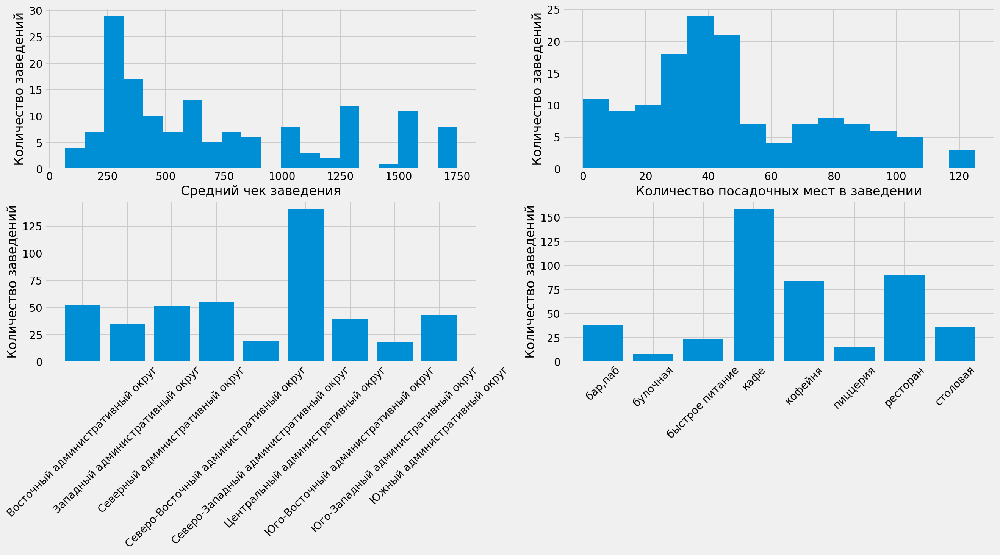

In [60]:
# Средний чек
plt.subplot(2, 2, 1)
plt.hist(street_down[street_down['avg_bill'] < 2000]['avg_bill'], bins=20)
plt.xlabel('Средний чек заведения')
plt.ylabel('Количество заведений')

# Количество мест
plt.subplot(2, 2, 2)
plt.hist(street_down[street_down['seats'] < 150]['seats'], bins=15)
plt.xlabel('Количество посадочных мест в заведении')
plt.ylabel('Количество заведений')

# Количество заведений от района
plt.subplot(2, 2, 3)
plt.bar(street_down.groupby(by=['district'], as_index=False)\
                   .agg(total_places=('total_places', 'sum'))['district'],
        street_down.groupby(by=['district'], as_index=False)\
                   .agg(total_places=('total_places', 'sum'))['total_places'])
plt.xticks(rotation=45)
plt.ylabel('Количество заведений')

# Количество заведений от категории
plt.subplot(2, 2, 4)
plt.bar(street_down.groupby(by=['category'], as_index=False)\
                   .agg(total_places=('total_places', 'sum'))['category'], 
        street_down.groupby(by=['category'], as_index=False)\
                   .agg(total_places=('total_places', 'sum'))['total_places'])
plt.xticks(rotation=45)
plt.ylabel('Количество заведений')

plt.show();

In [61]:
print('Количество уникальных улиц: ', places['street'].nunique())
print('Количество улиц с 1 заведением: ', street_down['name'].count())

Количество уникальных улиц:  1442
Количество улиц с 1 заведением:  453


Улиц с одним лишь заведением 453 штук из 1442. Можно отметить, что большинство таких улиц находится в центральном административном округе. А по типу заведения преобладают кафе. На втором и третьем местах находятся ресторан и кофейня, соответственно. Средний чек для таких заведений находится чаще в области от 250 до 750 р. А количество посадочных мест в основном до 100. То есть, можно обобщить, что это в основном средние (60 посадочных мест) и недорогие (средний чек до 750 р) кафе из Центрального административного округа Москвы.

Посмотрим, где на карте распологаются эти улицы.

По карте видно, что пусть большая часть улиц с 1 заведением распологается в Центральном округе, остальная часть таких заведений находится на отдалении от центра Москвы. При этом, что показательно, в Центральном округе это не самые дорогие заведения, самые дорогие находятся в Северо-Западном и Юго-Восточном округах.

### Средний чек заведения по округам

Посмотрим на картограмму заведений Москвы с учётом среднего чека этих заведений.

In [62]:
places.groupby('district', as_index=False)['middle_avg_bill']\
      .agg('median')\
      .sort_values(by=('middle_avg_bill'), ascending=False)

,district,middle_avg_bill
5,Центральный административный округ,1000.0
1,Западный административный округ,925.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [63]:
plot_choropleth(places, 'district', 'middle_avg_bill', 'median', 'Средний чек заведений по округам')

По карте можно отметить, что центральном административном округе средний чек в заведении выше, чем в остальных округах Москвы и составляет 1000 р, а для второго места в рейтинге (Западного округа) средний чек составил 925 р. Наименьший средний чек по заведениям по Юго-Восточному округу (450 р). Можно отметить, что удалённость от центра Москвы влияет на цену в заведениях - чем дальше от центра, тем меньше средний чек заведения подобного типа. Но при этом, цена всё ещё сильно зависит от типа заведения (так, в ресторанах и барах средний чек выходит на порядок дороже, чем в булочных или в быстром питании). Поэтому корректнее будет сравнивать средний чек по округам в зависимости от типа заведения.

### Промежуточные выводы:

- По количеству заведений больший процент приходится на кафе (28.6%), ресторан (23.6%) и кофейню (16.9%), а наименьший процент у булочной (3.1%).
- По количеству посадочных мест лидирующие позиции занимают ресторан и бар/паб с 90 местами, на третьем месте находится кофейня с 80 местами, а самой маленькой по размеру является булочная с 50 посадочными местами.
- У заведений бар/паб средний рейтинг наивысший и составляет 4.4 балла, для кофеен средний рейтинг составляет 4.3 балла, а наименьший рейтинг у заведений быстрого питания - чуть выше 4 баллов.
- В Москве сетевых заведений 38%, причём 70% сетевых заведений среди категорий общепита приходится на кафе, ресторан и кофейню, а реже всего сетевым заведением является столовая и булочная.
- По количеству заведений в сети наиболее распространённой является кофейня Шоколадница (120 заведений по Москве), при этом средний рейтинг от посетителей ниже 4.2 балла.
- Второе и третье место по количеству заведений в сети заняли пиццерии Доминос и Додо, при этом по рейтингу Додо выше Доминос на 0.11 балла.
- Все сетевые кофейни имеют рейтинг заведений ниже 4.2 баллов.
- Больше всего заведений в Центральном административном округе - более 2000 штук, а в других районах заведений меньше 1000.
- Наибольшую долю заведений в Центральном округе занимают рестораны (почти 30%), на кафе и кофейни приходится по 20%, а на заведения бар/паб почти 16%, в то время как в других районах доля бара/паба меньше 8%.
- Также для Центрального округа больше всего сетевых заведений.
- Суммарный средний рейтинг по заведениям всех категорий выше в Центральном округе, а наименьший - в Юго-Восточном.
- Суммарный средний чек заведений выше всего в Центральном округе. 
- Самый высокий чек у кофейни в Западном округе, и самый низкий в Юго-Восточном.
- Удалённость от центра влияет на цену в заведениях - чем дальше от центра, тем меньше средний чек по заведениям одного типа.
- Центральном округе больше всего круглосуточных кофеен - 26 штук, в других районах их меньше 10.
- Больше всего заведений находится на проспекте Мира (более 180), а на других улицах заведений меньше 130.
- Улиц с 1 заведением 255 штук из 1439. Большинство таких улиц находится в Центральном округе, а по типу заведения преобладает кафе.

## Открытие кофейни

Так как цель заказчика состоит в том, чтобы на основе проведённого анализа открыть свою кофейню, то посмотрим, насколько на данный момент для Москвы актуально заведение подобного типа.

In [64]:
print('Количество кофеен в Москве: ', 
      places_district.query('category == "кофейня"')['total_places'].sum())
print('Количество сетевых кофеен в Москве: ', 
      places_district.query('category == "кофейня"')['chain'].sum())

Количество кофеен в Москве:  1395
Количество сетевых кофеен в Москве:  710


### Сетевые кофейни Москвы

Посмотрим на топ популярных сетевых кофеен в Москве.

In [65]:
top_coffee = places.query('category == "кофейня" & chain == 1')\
                   .groupby(by=['name'], as_index=False)\
                   .agg(total_places = ('name', 'count'),
                        rating = ('rating', 'mean'),
                        middle_coffee = ('middle_coffee_cup', 'median'),
                        category =('category', 'first'))\
                   .sort_values(by=('total_places'), ascending=False)\
                   .head(15)\
                   .reset_index(drop=True)
top_coffee['part_places'] = round(top_coffee['total_places'] / top_coffee['total_places'].sum(), 3)

In [66]:
fig = plot_bar(top_coffee, 'total_places', 'name', 'total_places', '{0:.0f}', 'category')
fig.update_layout(title='Топ-15 популярных сетевых кофеен Москвы',
                  yaxis=dict(title='Название кофейни'),
                  xaxis=dict(title='Количество кофеен'),
                  showlegend=False)
fig.update_traces(textangle=0)
fig.show();

Наиболее распространённой кофейней в Москве является шоколадница. Также в тройку лидеров по количеству заведений в сети входят: one price coffee и cofix с количеством заведений более 60 в сети.

In [67]:
fig = plot_bar(top_coffee.sort_values(by=('rating'), ascending=False), 
               'rating', 'name', 'rating', '{0:.2f}', 'category')
fig.update_layout(title='Топ-15 популярных сетевых кофеен Москвы. Рейтинг',
                  yaxis=dict(title='Название заведения'),
                  xaxis=dict(title='Рейтинг заведений',
                             range=[3.8, 4.5]),
                  showlegend=False)
fig.show();

Из топа сетевых кофеен по Москве можно отметить, что пусть в среднем у них получается рейтинг ниже 4.2 баллов, есть кофейни с достаточным количеством кофеен в сети, у которых хорошие рейтинги. Так, например, "кофемания" имеет в сети 22 заведения и имеет средний рейтинг почти 4.5. И в то же время "шоколадница", у которой 120 заведений в сети, имеет общий средний рейтинг заведений 4.2.

In [68]:
fig = plot_bar(top_coffee.sort_values(by=('middle_coffee'), ascending=False), 
               'middle_coffee', 'name', 'middle_coffee', '{0:.0f}', 'category')
fig.update_layout(title='Топ-15 популярных сетевых кофеен Москвы. Стоимость чашки кофе',
                  yaxis=dict(title='Название кофейни'),
                  xaxis=dict(title='Средняя стоимость чашки кофе'),
                  showlegend=False)
fig.show();

В даблби самая высокая стоимость за чашку кофе: 275 р, хотя заведений в сети только 8 штук. В шоколаднице чашка кофе обойдётся в 256 рублей. Для четырёх сетевых кофеен не было информации о стоимости чашки кофе. Интересно, что в "cofix" чашка кофе гораздо ниже средней стоимости по Москве и составляет 60 р, при том, что в сети 60 заведений, но средний рейтинг у кофейни едва дотягивает до 4.1. А для "one price coffee" заведений в сети чуть больше, чем у "cofix", стоимость кофе выше (80 р), но рейтинг ниже на 0.2 пункта.  

### Кофейни по округам

In [69]:
# определение цветовой палитры для округов
color_plot = dict(zip(places.loc[:, ['district', 'chain']] \
                            .groupby(by=['district']) \
                            .sum()\
                            .index.to_list(), 
                      px.colors.qualitative.Plotly))

In [70]:
fig = plot_bar(places_district.query('category == "кофейня"')\
                              .sort_values(by='total_places', ascending=False), 
               'total_places', 'district', 'total_places', '{0:.0f}', 'district')
fig.update_layout(title='Количество кофеен по округам',
                  yaxis=dict(title='Округ Москвы'),
                  xaxis=dict(title='Количество заведений'),
                  showlegend=False)
fig.show();

Можно отметить, что больше всего кофеен в Москве приходится на Центральный административный округ - больше 400 (более 30% всех кофеен в Москве). Во всех остальных округах Москвы кофеен меньше 200 и на каждый район приходится меньше 14% от кофеен Москвы. Меньше всего кофеен в Северо-Западном округе. Таким образом, в Центральном округе самая высокая конкуренция среди кофеен, необходимо это учитывать при открытии кофейни. В остальных округах конкуренция ниже.

### Круглосуточные кофейни

In [71]:
print('Количество круглосуточных кофеен в Москве: ', 
      places[(places['category'] == 'кофейня') & (places['is_24/7'])]['is_24/7'].sum())

Количество круглосуточных кофеен в Москве:  59


In [72]:
fig = plot_bar(places_district.query('category == "кофейня"')\
                              .sort_values(by='is_24_7', ascending=False), 
               'is_24_7', 'district', 'is_24_7', '{0:.0f}', 'district')
fig.update_layout(title='Количество круглосуточных кофеен по округам',
                  yaxis=dict(title='Округ Москвы'),
                  xaxis=dict(title='Количество круглосуточных кофеен'),
                  showlegend=False)
fig.show();

В Центральном административном округе больше всего круглосуточных кофеен - 26 из 426 заведений. Во всех остальных округах таких кофеен меньше 10 штук на округ. Но при этом и самих заведений типа кофейни в Центральном округе больше, чем в других округах. 

### Рейтинг кофеен

In [73]:
fig = plot_bar(places_district.query('category == "кофейня"')\
                              .sort_values(by='rating', ascending=False), 
               'rating', 'district', 'rating', '{0:.2f}', 'district')
fig.update_layout(title='Средний рейтинг кофеен по округам',
                  yaxis=dict(title='Округ Москвы'),
                  xaxis=dict(title='Средний рейтинг кофейни',
                             range=[4, 4.4]),
                  showlegend=False)
fig.show();

В целом, средние рейтинги кофеен для округов Москвы близки между собой (находятся между 4.19 и 4.34). 

Можно отметить, что выше всего средний рейтинг кофеен в Центральном округе, а ниже всего в Западном. В Северо-Западном административном округе по рейтингу кофейни занимают второе место, при том, что по количеству заведений он находится на последнем месте. А вот с Западным округом другая ситуация: по количеству заведений он в лидерах, но по рейтингу хуже всех. С точки зрения открытия кофейни, лучше ортиентироваться на округа со средним рейтингом, так как в округах с высоким рейтингом, конкуренция выше (люди, скорее, пойдут в известную кофейню с высоким рейтингом и большим количеством отметок, чем в незнакомое им место).

### Средняя цена за кофе

In [74]:
print('Средняя цена за чашку капучино в кофейне: ', 
      places.query('category == "кофейня"')['middle_coffee_cup'].median())

Средняя цена за чашку капучино в кофейне:  165.0


Посмотрим на гистограмму распределения средней цены за чашку кофе для кофеен.

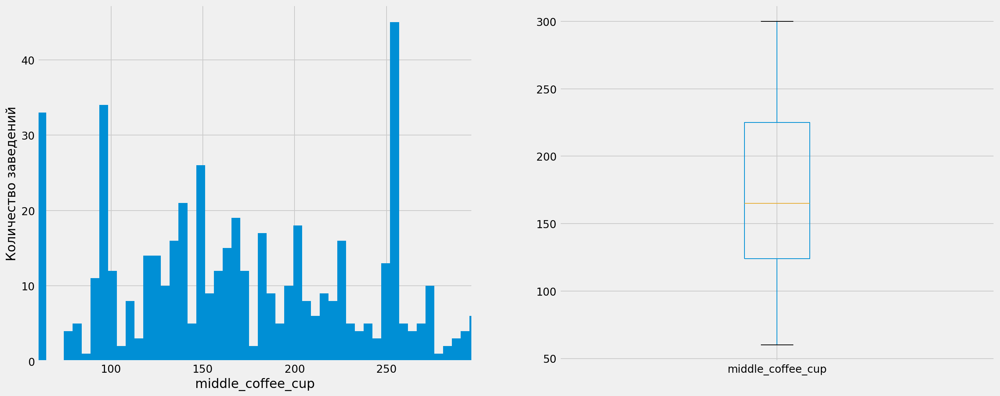

In [75]:
first_hist(places.query('category == "кофейня"'), 'middle_coffee_cup', 50)

По гистограмме можно отметить, что пусть медианное значение и составляет 165 р, на графике явно видны три дополнительных максимума: чуть выше 50 р, около 100 р и около 250 р.

In [76]:
fig = plot_box(places.query('category == "кофейня"'), 
               'middle_coffee_cup', 'district', 'district', 'middle_coffee_cup')
fig.update_layout(title='Средняя стоимость чашки кофе в кофейне по округам',
                  yaxis=dict(title='Округ Москвы'),
                  xaxis=dict(title='Средняя стоимость чашки кофе'),
                  showlegend=False)
fig.show()

На графике средней стоимости чашки кофе в кофейне для всех административных округов Москвы видно, что наибольшее медианное значение для Юго-Западного округа, а наименьшее - для Восточного (при этом для Восточного оно ниже, чем среднее значение по всей Москве). Также можно отметить, что область около 250 рублей за чашку кофе охватывают Центральный и Западный административные округи. 

In [77]:
fig = plot_bar(places_district.query('category == "кофейня"')\
                              .sort_values(by='coffee_cup', ascending=False), 
               'coffee_cup', 'district', 'coffee_cup', '{0:.0f}', 'district')
fig.update_layout(title='Медианная средняя стоимость чашки кофе в кофейне по округам',
                  yaxis=dict(title='Округ Москвы'),
                  xaxis=dict(title='Средняя стоимость чашки кофе'),
                  showlegend=False)
fig.show();

Средняя стоимость чашки кофе в кофейне зависит от округа Москвы. Так, в Западном административном округе, Центральном и Юго-Западном, средняя стоимость выше всех остальных - выше 180 руб за чашку кофе. А в Юго-Восточном ниже всего - 140 руб за чашку кофе. 

При открытии кофейни стоит ориентироваться на среднюю цену по округу, так как цена может складываться из многих факторов (стоимость аренды помещения, престиж заведения, престиж места расположения и т.д). Привлекательными административными округами с этой точки зреняи являются Юго-Западный (цена на кофе выше среднего по Москве, но при этом меньше конкуренции в округе, но необходимо будет учесть моменты с арендой), Северо-Западный и Северо-Восточный округа.

### Фоновая карта кофеен

Посмотрим на карте, как расположены кофейни в Москве.

In [78]:
plot_choropleth(places.query('category == "кофейня"'), 'district', 
                'middle_coffee_cup', 'mean', 'Медианная средняя стоимость чашки кофе по округам')

В Восточном и Юго-Восточном округах самая низкая средняя стоимость за чашку кофе, при этом ещё и кофеен не так много, как в других округах. Можно отметить, что перспективными смотрятся: Северо-Западный и Северо-Восточный округа, так как мало кофеен и средняя стоимость чашки кофе в кофейнях для них выше среднего по Москве. Также можно отметить Западный округ, но там нужно подробнее обратить внимание на расположение кофейни, удалении от центра Москвы и расположение других кофеен рядом. 

### Топ-15 улиц с кофейнями:

Посмотрим на топ-15 улиц, на которых у кофеен самый высокий рейтинг и самая высокая стоимость за чашку кофе.

In [79]:
# Количество кофеен по улицам
top_street_coffee = places.query('category == "кофейня"')\
                          .groupby(by=['street'], as_index=False)\
                          .agg(total_places = ('name', 'count'),
                               district = ('district', 'first'),
                               lat = ('lat', 'first'),
                               lng = ('lng', 'first'),
                               rating = ('rating', 'mean'),
                               middle_coffee = ('middle_coffee_cup', 'median'))\
                          .sort_values(by=(['middle_coffee', 'rating']), ascending=False)\
                          .head(15)  
top_street_coffee

,street,total_places,district,lat,lng,rating,middle_coffee
82,богословский переулок,1,Центральный административный округ,55.762591,37.599530,4.600,300.0
95,большая сухаревская площадь,1,Центральный административный округ,55.771638,37.636840,4.400,300.0
334,площадь победы,1,Западный административный округ,55.735162,37.517861,4.300,291.0
32,3-й крутицкий переулок,2,Центральный административный округ,55.731914,37.664709,4.150,291.0
481,улица гарибальди,1,Юго-Западный административный округ,55.671280,37.554501,4.100,291.0
246,милютинский переулок,1,Центральный административный округ,55.765695,37.632350,4.500,290.0
158,енисейская улица,2,Северо-Восточный административный округ,55.865204,37.661509,4.250,287.0
414,стремянный переулок,2,Центральный административный округ,55.727152,37.626423,4.450,285.0
261,мясницкая улица,4,Центральный административный округ,55.768246,37.642538,4.475,283.0
601,центральный административный округ,4,Центральный административный округ,55.778830,37.645842,4.525,275.0


In [80]:
plot_choropleth(places.query('category == "кофейня"'), 'district', 
                'rating', 'mean', 'Средний рейтинг кофеен по округам')

Большинство улиц, на которых самый высокий рейтинг у кофейни и самая высокая средняя стоимость за чашку кофе, в основном находятся в окрестности Центрального округа. Только две улицы находятся в других округах в отдалении от центра Москвы: улица Енисейская (2 кофейни, 287 рублей за чашку кофе, рейтинг 4.3) и улица Гарибальди (1 заведение, 290 рубелй за чашку кофе, рейтинг 4.1). 

### Промежуточные выводы:

- В Москве на данный момент расположена 1391 кофейня.
- Больше всего кофеен приходится на Центральный административный округ (более 30% всех кофеен Москвы).
- Во всех остальных районах кофеен меньше 200, на каждый округ приходится меньше 14% от кофеен Москвы.
- Меньше всего кофеен в Северо-Западном округе.
- В Центральном округе больше всего круглосуточных кофеен - 25 из 428 заведений. В остальных округах круглосуточных кофеен меньше 10.
- Выше всего средний рейтинг кофеен в Центральном округе, а ниже всего в Западном и составляют 4.34 и 4.19 балла, соответственно.
- Средняя стоимость чашки капучино в Москве составляет 165 рублей.
- В Западном, Центральном и Юго-Западном округах средняя цена чашки кофе выше 180 рублей.
- Самая дешёвая чашка кофе в Юго-Восточном и Восточном округах - там она стоит около 140 рублей.
- При открытии кофейни лучше всего ориентироваться на Северо-Западный и Северо-Восточный округа, так как там меньше плотность кафе и чашка кофе выше средней стоимости по Москве, а также в эти округах рейтинги кофеен находятся на среднем уровне.
-  Большинство улиц, на которых самый высокий рейтинг у кофейни и самая высокая средняя стоимость за чашку кофе, в основном находятся в окрестности Центрального округа. 
- Только две улицы находятся в других округах в отдалении от центра Москвы: улица Енисейская (2 кофейни, 287 рублей за чашку кофе, рейтинг 4.3) и улица Гарибальди (1 заведение, 290 рубелй за чашку кофе, рейтинг 4.1).

## Итоги исследования:

Было проведено исследование заведений общественного питания в Москве (данные актуальные на лето 2022 года). Необходимо было проанализировать данные и предоставить заказчикам оптимальный вариант размещения заведения общепита.

Перед анализом, данные были подготовлены для корректной работы:
- В таблице находилось 13 столбцов и 8406 строчек с данными о заведениях общественного питания Москвы.
- В таблице не было явных и неявных дубликатов.
- В таблице в 6 столбцах были пропуски значений, причём в пяти столбцах они занимали более 40%.
- Были заполнены пропуски в столбцах со средней ценой в чеке и количеством посадочных мест медианными значениями по району в зависимости от типа заведения.
- Были добавлены столбцы с улицей заведения и графиком работы.
- Были удалены аномальные значения из таблицы в столбцах с количеством посадочных мест, со средним чеком. Удалённые данные составили 2.3% от всех данных в датафрейме.

Была проанализирована общая информация об заведниях Москвы:
- По количеству заведений больший процент приходится на кафе (28.4%), ресторан (24.1%) и кофейню (16.8%), а наименьший процент у булочной (3.1%).
- По количеству посадочных мест лидирующие позиции занимают ресторан и бар/паб с 90 местами, на третьем месте находится кофейня с 80 местами, а самой маленькой по размеру является булочная с 50 посадочными местами.
- У заведений бар/паб средний рейтинг наивысший и составляет 4.4 балла, для кофеен средний рейтинг составляет 4.3 балла, а наименьший рейтинг у заведений быстрого питания - чуть выше 4 баллов.
- В Москве сетевых заведений 38%, причём 70% сетевых заведений среди категорий общепита приходится на кафе, ресторан и кофейню, а реже всего сетевым заведением является столовая и булочная.
- Чаще всего сетевыми заведениями являются булочные (61%), а реже всего - бары (22%). При этом в тройку сетевых заведений входят булочная, пиццерия и кофейня.
- По количеству заведений в сети наиболее распространённой является кофейня Шоколадница (120 заведений по Москве), при этом средний рейтинг от посетителей ниже 4.2 балла.
- Второе и третье место по количеству заведений в сети заняли пиццерии Доминос и Додо, при этом по рейтингу Додо выше Доминос на 0.11 балла.
- Все сетевые кофейни в среднем имеют рейтинг заведений ниже 4.2 баллов.
- Больше всего заведений в Центральном административном округе - более 2000 штук, а в других районах заведений меньше 1000.
- Наибольшую долю заведений в Центральном округе занимают рестораны (почти 30%), на кафе и кофейни приходится по 20%, а на заведения бар/паб почти 16%, в то время как в других районах доля бара/паба меньше 8%.
- Также для Центрального округа больше всего сетевых заведений.
- Суммарный средний рейтинг по заведениям всех категорий выше в Центральном округе, а наименьший - в Юго-Восточном.
- Суммарный средний чек заведений выше всего в Центральном округе.
- Самый высокий чек у кофейни в Западном округе, и самый низкий в Юго-Восточном.
- Удалённость от центра влияет на цену в заведениях - чем дальше от центра, тем меньше средний чек по заведениям одного типа.
- Центральном округе больше всего круглосуточных кофеен - 26 штук, в других районах их меньше 10.
- Больше всего заведений находится на проспекте Мира (более 180), а на других улицах заведений меньше 130.
- Улиц с 1 заведением 255 штук из 1439. Большинство таких улиц находится в Центральном округе, а по типу заведения преобладает кафе.

Далее более подробно были рассмотрены кофейни в Москве:
- В Москве на данный момент расположена 1391 кофейня, причём 708 - сетевые заведения.
- Больше всего кофеен приходится на Центральном административном округе (более 30% всех кофеен Москвы).
- Во всех остальных районах кофеен меньше 200, на каждый район приходится меньше 14% от кофеен Москвы.
- Меньше всего кофеен в Северо-Западном округе.
- В Центральном округе больше всего круглосуточных кофеен - 25 из 428 заведений. В остальных районах круглосуточных кофеен меньше 10 на район.
- Выше всего средний рейтинг кофеен в Центральном округе, а ниже всего в Западном и составляют 4.34 и 4.19 балла, соответственно.
- Средняя стоимость чашки капучино в Москве составляет 165 рублей.
- В Западном, Центральном и Юго-Западном округах средняя цена чашки кофе выше 180 рублей.
- Самая дешёвая чашка кофе в Юго-Восточном и Восточном округах - там она стоит около 140 рублей.

Таким образом, можно подвести общий итог:
- Открытие кофейни является перспективным направлением (17% заведений в Москве приходится на кофейни).
- Сетевые кофейни имеют общий средний рейтинг ниже 4.2 баллов, при этом из 1395 кофейни в Москве 710 - сетевые заведения. 
- Только одна сетевая кофейня с 20 заведениями имеет средний рейтинг 4.5, все остальные с хорошим средним рейтингом имеют мало заведений в сети. 
- Крупносетевые кофейни имеют низкие рейтинги. При открытии уникальной кофейни можно этим воспользоваться.
- При открытии кофейни лучше всего ориентироваться на Северо-Западный и Северо-Восточный округа, так как там меньше плотность кафе и чашка кофе выше средней стоимости по Москве, а также в эти округах рейтинги кофеен находятся на среднем уровне.
-  Большинство улиц, на которых самый высокий рейтинг у кофейни и самая высокая средняя стоимость за чашку кофе, в основном находятся в окрестности Центрального округа. 
- Только две улицы находятся в других округах в отдалении от центра Москвы: улица Енисейская (2 кофейни, 287 рублей за чашку кофе, рейтинг 4.3) и улица Гарибальди (1 заведение, 290 рублей за чашку кофе, рейтинг 4.1).

Рекомендация:
- Выбрать среднюю чашку кофе в кофейне выше 165 рублей (в области 180-200 рублей).
- Выбрать для местоположения кофейни Северо-Западный и Северо-Восточный округа, в частности улица Енисейская в Северо-Восточном округе (2 кофейни, рейтинг 4.3, средняя стоимость чашки кофе гораздо выше средней по Москве и округу и составляет 287 рублей).

Презентация:

https://disk.yandex.ru/i/9R4PwNaTx71DYg